### Repeating the process of producing the LDA visualizations for each of the episodes for the final season ###

In [1]:
from glob import glob
import re
import string
import funcy as fp
from gensim import models
from gensim.corpora import Dictionary, MmCorpus
import nltk
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='once')

In [3]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import numpy as np
import pickle
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.decomposition import TruncatedSVD

/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [4]:
knight = pickle.load( open( "./Data/knight_2.pkl", "rb" ) )

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: ResourceWarning: unclosed file <_io.BufferedReader name='./Data/knight_2.pkl'>
  """Entry point for launching an IPython kernel.


In [5]:
knight = knight.dropna()

In [6]:
knight.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36212 entries, 47563 to 84197
Data columns (total 2 columns):
Publish Date    36212 non-null datetime64[ns]
clean           36212 non-null object
dtypes: datetime64[ns](1), object(1)
memory usage: 848.7+ KB


In [7]:
text = knight['clean']

In [8]:
import spacy
from spacy.lang.en import English
parser = English()

def tokenize(text):
    lda_tokens = []
    tokens = parser(text)
    for token in tokens:
        if token.orth_.isspace():
            continue
        elif token.like_url:
            lda_tokens.append('URL')
        elif token.orth_.startswith('@'):
            lda_tokens.append('SCREEN_NAME')
        else:
            lda_tokens.append(token.lower_)
    return lda_tokens

/anaconda3/lib/python3.7/site-packages/thinc/neural/train.py:7: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from .optimizers import Adam, linear_decay
/anaconda3/lib/python3.7/site-packages/thinc/check.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Sequence, Sized, Iterable, Callable


In [9]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/nborders/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [10]:
from nltk.corpus import wordnet as wn
def get_lemma(word):
    lemma = wn.morphy(word)
    if lemma is None:
        return word
    else:
        return lemma
    
from nltk.stem.wordnet import WordNetLemmatizer
def get_lemma2(word):
    return WordNetLemmatizer().lemmatize(word)

In [11]:
nltk.download('stopwords')
en_stop = set(nltk.corpus.stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nborders/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [12]:
stop_words = ['would', 'could', 'might', 'season', 'think', 'one', 'watch', 'episode', 'something', 'theory', 'maybe',
             'scene', 'anyone', 'really', 'still', 'anyone', 'already', 'anything', 'never', 'everyone', 'even']

In [13]:
def prepare_text_for_lda(text):
    tokens = tokenize(text)
    tokens = [token for token in tokens if len(token) > 4]
    tokens = [token for token in tokens if token not in en_stop]
    tokens = [token for token in tokens if token not in stop_words]
    tokens = [get_lemma(token) for token in tokens]
    return tokens

In [14]:
import random
text_data = []
for line in text:
    tokens = prepare_text_for_lda(line)
    if random.random() > .99:
        text_data.append(tokens)

In [15]:
text_data = [x for x in text_data if x != []]

In [16]:
vectorizer = CountVectorizer(stop_words='english')
doc_word = vectorizer.fit_transform(knight['clean'])
doc_word.shape

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(36212, 18381)

In [18]:
lsa = TruncatedSVD(3)
doc_topic = lsa.fit_transform(doc_word)
lsa.explained_variance_ratio_

array([0.15416702, 0.03675872, 0.03436911])

In [20]:
def display_topics(model, feature_names, no_top_words, topic_names=None):
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix)
        else:
            print("\nTopic: '",topic_names[ix],"'")
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [21]:
display_topics(lsa, vectorizer.get_feature_names(), 10)


Topic  0
king, night, jon, bran, dany, like, cersei, episode, battle, winterfell

Topic  1
mud, jon, arya, sansa, jaime, like, brienne, tyrion, dany, think

Topic  2
bran, mud, time, like, think, said, water, magic, death, earth


In [22]:
from gensim import corpora
dictionary = corpora.Dictionary(text_data)

In [23]:
corpus = [dictionary.doc2bow(text) for text in text_data]

In [122]:
#pickle.dump(corpus, open('corpus_winterfell.pkl', 'wb'))
#dictionary.save('dictionary_winterfell.gensim')

In [26]:
import gensim
NUM_TOPICS = 2
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=20)
#ldamodel.save('model4_winterfell.gensim')

In [27]:
topics = ldamodel.print_topics(num_words=10)
for topic in topics:
    print(topic)

(0, '0.022*"night" + 0.013*"winterfell" + 0.011*"theon" + 0.010*"sansa" + 0.008*"battle" + 0.007*"first" + 0.006*"try" + 0.006*"people" + 0.005*"right" + 0.005*"thing"')
(1, '0.010*"character" + 0.009*"gendry" + 0.009*"white" + 0.008*"jaime" + 0.008*"people" + 0.007*"going" + 0.006*"brienne" + 0.005*"daenerys" + 0.005*"first" + 0.005*"tormund"')


In [ ]:
#dictionary = gensim.corpora.Dictionary.load('dictionary.gensim')
#corpus = pickle.load(open('corpus.pkl', 'rb'))
#lda = gensim.models.ldamodel.LdaModel.load('model5.gensim')

In [28]:
import pyLDAvis.gensim
lda_display = pyLDAvis.gensim.prepare(ldamodel, corpus, dictionary, sort_topics=True)
pyLDAvis.display(lda_display)

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


In [29]:

#pyLDAvis.save_html(lda_display, 'lda_knight_2.html')

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: ResourceWarning: unclosed file <_io.TextIOWrapper name='lda_knight_2.html' mode='w' encoding='UTF-8'>
  


In [30]:
corpus_cloud = ' '.join(knight['clean'])

In [31]:
STOPWORDS.update(['would', 'could', 'might', 'season', 'think', 'one', 'watch', 'episode', 'something', 'theory', 'maybe',
             'scene', 'anyone', 'really', 'still', 'anyone', 'already', 'anything', 'never', 'everyone', 'even'])

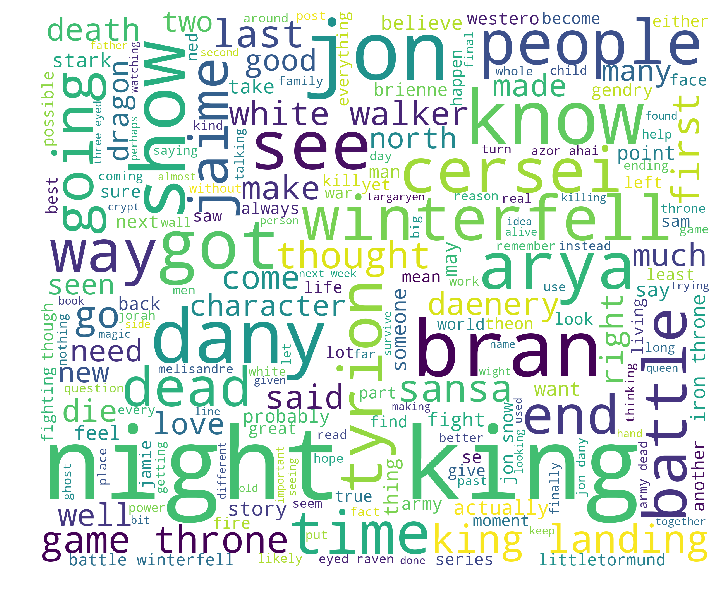

In [40]:
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white',width=2400,height=2000).generate(corpus_cloud)
plt.figure(figsize=(12,15))
plt.imshow(wordcloud)
plt.axis('off')
#plt.savefig('knight_2.svg')
#plt.savefig('knight_2.png')
plt.show()

In [32]:
from sklearn.decomposition import TruncatedSVD

In [33]:
knight['clean'].iloc[0]

'dragon think something eating cold known change gender maybe eating lay also made clear eating think meaning behind also theory dragon family crypt'

In [34]:
count_vectorizer = CountVectorizer(analyzer = 'word', encoding = 'string',  strip_accents = 'unicode',
                                   stop_words='english', token_pattern="\\b[a-z][a-z]+\\b")
count_knight = count_vectorizer.fit_transform(knight['clean'])
count_knight.shape

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


(36212, 18351)

In [35]:
lsa_count = TruncatedSVD(2)
count_doc_topic = lsa_count.fit_transform(count_knight)
lsa_count.explained_variance_ratio_

array([0.15400613, 0.03673568])

In [37]:
from sklearn.cluster import KMeans
import seaborn as sns

/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


In [38]:
text = knight['clean']

In [39]:
text.head()

47563    dragon think something eating cold known chang...
47564                                really like sometimes
47565    jon arya love jon arya reunite without hesitat...
47566                             official disturber peace
47567    got giant blood said hodor several time really...
Name: clean, dtype: object

In [40]:
tfidf  = TfidfVectorizer()

docs   = tfidf.fit_transform(text)

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


In [43]:
clusters = KMeans(n_clusters=2)
clusters.fit(docs)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [44]:
from yellowbrick.text import TSNEVisualizer
from sklearn.feature_extraction.text import TfidfVectorizer
from yellowbrick.features import ParallelCoordinates

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


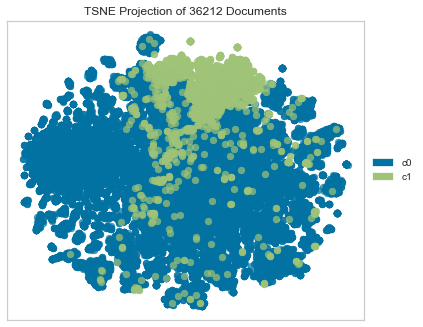

In [46]:
tsne = TSNEVisualizer()
tsne.fit(docs, ["c{}".format(c) for c in clusters.labels_])
tsne.poof()

In [47]:
from __future__ import print_function
import time
import numpy as np
import pandas as pd
from sklearn.datasets import fetch_mldata
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

In [48]:
df = pd.DataFrame()

In [49]:
svd = TruncatedSVD(2)
pca_result = svd.fit_transform(docs)

df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1] 
print('Explained variation per principal component: {}'.format(svd.explained_variance_ratio_))

Explained variation per principal component: [0.00825061 0.01060838]


In [50]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 36212 samples in 0.016s...
[t-SNE] Computed neighbors for 36212 samples in 0.954s...
[t-SNE] Computed conditional probabilities for sample 1000 / 36212
[t-SNE] Computed conditional probabilities for sample 2000 / 36212
[t-SNE] Computed conditional probabilities for sample 3000 / 36212
[t-SNE] Computed conditional probabilities for sample 4000 / 36212
[t-SNE] Computed conditional probabilities for sample 5000 / 36212
[t-SNE] Computed conditional probabilities for sample 6000 / 36212
[t-SNE] Computed conditional probabilities for sample 7000 / 36212
[t-SNE] Computed conditional probabilities for sample 8000 / 36212
[t-SNE] Computed conditional probabilities for sample 9000 / 36212
[t-SNE] Computed conditional probabilities for sample 10000 / 36212
[t-SNE] Computed conditional probabilities for sample 11000 / 36212
[t-SNE] Computed conditional probabilities for sample 12000 / 36212
[t-SNE] Computed conditional probabilities for sa

/anaconda3/lib/python3.7/site-packages/numpy/matrixlib/defmatrix.py:71: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  return matrix(data, dtype=dtype, copy=False)


[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.828499
[t-SNE] KL divergence after 300 iterations: 3.701626
t-SNE done! Time elapsed: 150.75629496574402 seconds


In [80]:
df['tsne-2d-one'] = tsne_results[:,0]
df['tsne-2d-two'] = tsne_results[:,1]
df['cluster'] = clusters.labels_

df['text'] = knight['clean']

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36212 entries, 0 to 36211
Data columns (total 6 columns):
pca-one        36212 non-null float64
pca-two        36212 non-null float64
tsne-2d-one    36212 non-null float32
tsne-2d-two    36212 non-null float32
cluster        36212 non-null int32
text           36212 non-null object
dtypes: float32(2), float64(2), int32(1), object(1)
memory usage: 1.2+ MB


In [79]:
knight = knight.reset_index()

In [82]:
#df.to_csv('knight.csv', index = False)

In [85]:
import plotly_express as px
px.scatter(df,
    x='tsne-2d-one',
    y='tsne-2d-two',
    hover_name='text',
    color='cluster', color_continuous_scale = px.colors.sequential.Plasma)